In [16]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from dsn.util.systems import system_from_str
from dsn.train_dsn import train_dsn
import seaborn as sns
import pandas as pd
import warnings
import scipy
warnings.filterwarnings("ignore")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [17]:
system_D = 2;
system_str = 'linear_%dD' % system_D;

behavior_str = 'oscillation';

system_class = system_from_str(system_str);
system = system_class(behavior_str);
print(system.name)

all_nlayers = [10];
c_inits = [-5];
sigmas = [1];
random_seeds = [1,2,3,4,5];

num_nlayers = len(all_nlayers);
num_c_inits = len(c_inits);
num_sigmas = len(sigmas);
num_random_seeds = len(random_seeds);

linear_2D


(12501, 4)
mu [  0.           1.          12.56637061 158.91367042]
(12501, 4)
mu [  0.           1.          12.56637061 158.91367042]
(12501, 4)
mu [  0.           1.          12.56637061 158.91367042]
(12501, 4)
mu [  0.           1.          12.56637061 158.91367042]
(12501, 4)
mu [  0.           1.          12.56637061 158.91367042]


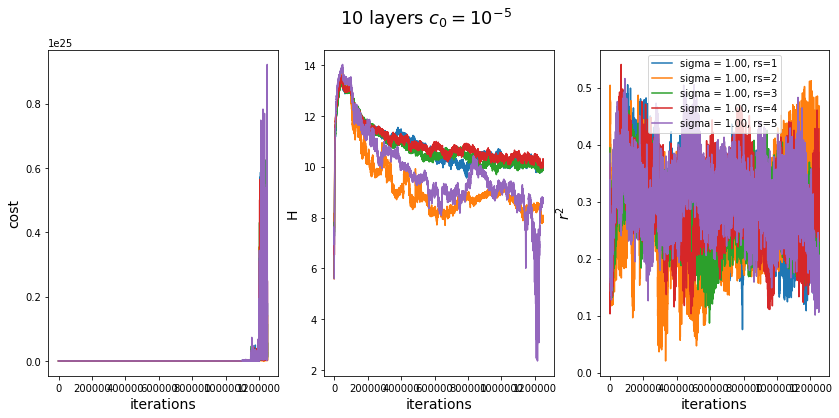

In [18]:
figsize = (14, 6);
fontsize = 14;
random_seed = 0;
basedir = '/Users/sbittner/Documents/dsn/dsn/results/';
dirstr = 'linear_2D';

for i in range(num_nlayers):
    nlayers = all_nlayers[i];
    for j in range(num_c_inits):
        c_init = c_inits[j];
        plt.figure(figsize=figsize);
        for k in range(num_sigmas):
            sigma = sigmas[k];
            for ii in range(num_random_seeds):
                rs = random_seeds[ii];
                label = 'sigma = %.2f, rs=%d' % (sigma, rs);
            
                savedir = basedir + dirstr + '/linear_2D_D=4_flow=M_%dP_sigma=%.2f_lr_order=-3_c=%d_rs=%d/' \
                                            % (nlayers, sigma, c_init, rs);
                fname = savedir + 'results.npz';

                npzfile = np.load(fname);
                check_rate = npzfile['check_rate'];
                costs = npzfile['costs'];
                Hs = npzfile['Hs'];
                R2s = npzfile['R2s'];
                mean_T_phis = npzfile['mean_T_phis'];
                print(mean_T_phis.shape)
                mu = npzfile['mu'];
                print('mu', mu);
                behavior = npzfile['behavior'];

                phis = npzfile['phis'];
                T_phis = npzfile['T_phis'];
                log_q_phis = npzfile['log_q_phis'];
                last_ind = npzfile['it']//check_rate;
                k_max = phis.shape[0]-1;

                nits = costs.shape[0];
                iterations = np.arange(0, check_rate*nits, check_rate);

                plt.subplot(1,3,1);
                plt.plot(iterations[:last_ind], costs[:last_ind], label=label);

                plt.subplot(1,3,2);
                plt.plot(iterations[:last_ind], Hs[:last_ind], label=label);

                plt.subplot(1,3,3);
                plt.plot(iterations[:last_ind], R2s[:last_ind], label=label);

            plt.subplot(1,3,1);
            plt.xlabel('iterations', fontsize=fontsize);
            plt.ylabel('cost', fontsize=fontsize);

            plt.subplot(1,3,2);
            plt.xlabel('iterations', fontsize=fontsize);
            plt.ylabel('H', fontsize=fontsize);

            plt.subplot(1,3,3);
            plt.xlabel('iterations', fontsize=fontsize);
            plt.ylabel(r'$r^2$', fontsize=fontsize);

            plt.legend();

            plt.suptitle(r'%d layers $c_0 = 10^{%d}$' % (nlayers, c_init), \
                         fontsize=fontsize+4);

        plt.show();


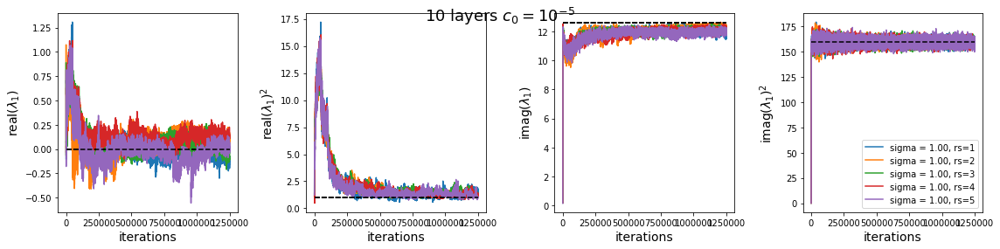

In [19]:
figsize = (16, 4);
constraint_names = [r'real$(\lambda_1)$', r'real$(\lambda_1)^2$', \
                    r'imag$(\lambda_1)$', r'imag$(\lambda_1)^2$'];
for i in range(num_nlayers):
    nlayers = all_nlayers[i];
    for j in range(num_c_inits):
        c_init = c_inits[j];
        plt.figure(figsize=figsize);
        for k in range(num_sigmas):
            sigma = sigmas[k];
            for ii in range(num_random_seeds):
                rs = random_seeds[ii];
                label = 'sigma = %.2f, rs=%d' % (sigma, rs);

                savedir = basedir + dirstr + '/linear_2D_D=4_flow=M_%dP_sigma=%.2f_lr_order=-3_c=%d_rs=%d/' \
                                            % (nlayers, sigma, c_init, rs);
                fname = savedir + 'results.npz';
                npzfile = np.load(fname);

                mean_T_phis = npzfile['mean_T_phis'];
                check_rate = npzfile['check_rate'];

                last_ind = npzfile['it']//check_rate;
                num_suff_stats = mean_T_phis.shape[1];
                for i in range(num_suff_stats):
                    plt.subplot(1,4,i+1);
                    plt.plot(iterations[:last_ind], mean_T_phis[:last_ind,i], label=label);
                    plt.plot([iterations[0], iterations[last_ind]], [mu[i], mu[i]], 'k--');
                    #plt.ylim([mu[i]-buf[i], mu[i]+buf[i]]);
                    if (k==0): 
                        plt.xlabel('iterations', fontsize=fontsize);
                        plt.ylabel(constraint_names[i], fontsize=fontsize);

            plt.legend();

            plt.suptitle(r'%d layers $c_0 = 10^{%d}$' % (nlayers, c_init), fontsize=fontsize+4);
            plt.tight_layout();

        plt.show();

In [20]:
k_max = 25;
num_rs = 5;
sigma = 1.0;

mu_len = 4;
p_values = np.zeros((num_rs, k_max, mu_len));
for rs in range(1, 1+num_rs):

    savedir = basedir + dirstr + '/linear_2D_D=4_flow=M_%dP_sigma=%.2f_lr_order=-3_c=%d_rs=%d/' \
                                            % (nlayers, sigma, c_init, rs);
    fname = savedir + 'results.npz';
    npzfile = np.load(fname);
    title ='sigma=%.2f_rs=%d' % (sigma, rs)
    mu = npzfile['mu']

    for k in range(k_max):
        T_phis = npzfile['T_phis'][k+1];

        for i in range(mu_len):
            t, p = scipy.stats.ttest_1samp(T_phis[:100,i], mu[i]);
            p_values[rs-1,k,i] = p;

            

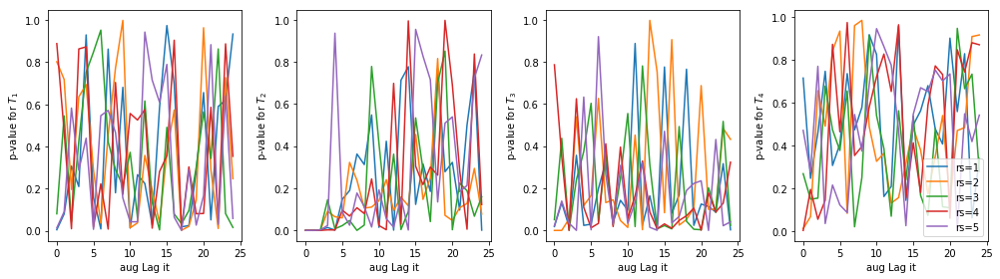

In [21]:
figsize = (14, 4);
plt.figure(figsize=figsize);
for rs in range(1, 1+num_rs):
    label = 'rs=%d' % rs;
    for i in range(mu_len):
        plt.subplot(1,4,i+1);
        plt.plot(p_values[rs-1,:,i], label=label);
        if (rs==1):
            plt.ylabel(r'p-value for $T_%d$' % (i+1));
            plt.xlabel('aug Lag it');
plt.tight_layout();
plt.legend();
plt.show();


In [50]:
alpha = 0.05;
AL_final_its = [];
for i in range(num_rs):
    print('i=%d' % i);
    for j in range(k_max):
        con_sat = np.prod(p_values[i,j,:] > alpha);
        if (con_sat==1):
            AL_final_its.append(j);
            break;
print(AL_final_its);


i=0
i=1
i=2
i=3
i=4
[7, 3, 3, 9, 4]


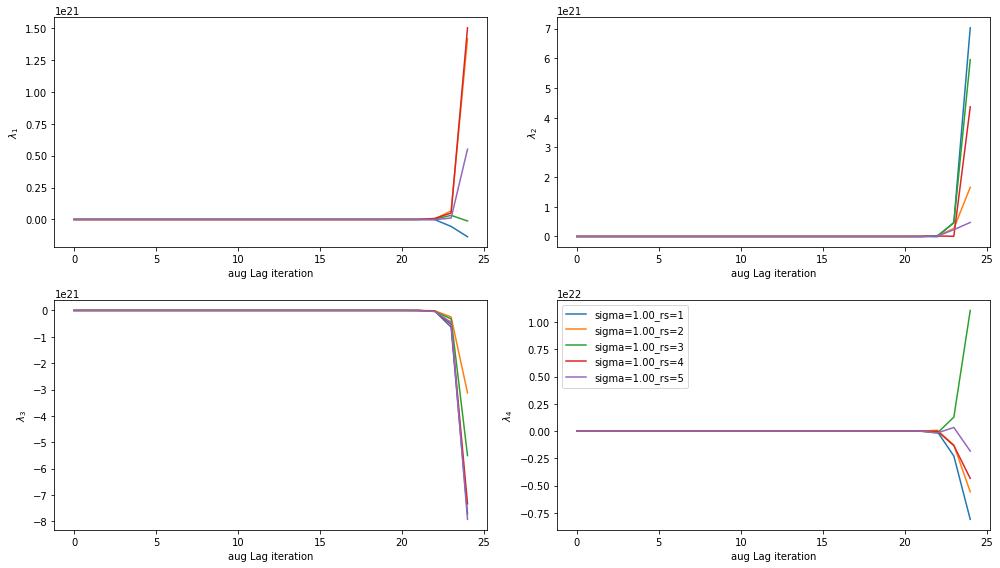

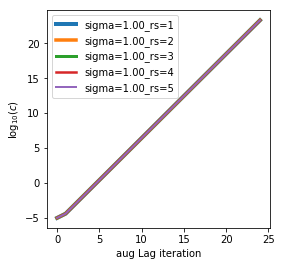

In [48]:
sigma = 1.0;
figsize = (14, 8);
plt.figure(figsize=figsize);
for rs in range(1,6):
    savedir = basedir + dirstr + '/linear_2D_D=4_flow=M_%dP_sigma=%.2f_lr_order=-3_c=%d_rs=%d/' \
                                            % (nlayers, sigma, c_init, rs);
    npzfile = np.load(savedir + 'results.npz');
    label = 'sigma=%.2f_rs=%d' % (sigma, rs);

    lambdas = npzfile['lambdas'];
    num_cons = lambdas.shape[1];
    iters = np.arange(lambdas.shape[0]);
    for i in range(num_cons):
        plt.subplot(2, num_cons//2, i+1);
        plt.plot(iters, lambdas[:,i], label=label);
        if (rs==1):
            plt.ylabel(r'$\lambda_%d$' % (i+1));
        plt.xlabel('aug Lag iteration');
plt.tight_layout();
    
plt.legend();
plt.show();

figsize = (4, 4);
plt.figure(figsize=figsize);
for rs in range(1,6):
    savedir = basedir + dirstr + '/linear_2D_D=4_flow=M_%dP_sigma=%.2f_lr_order=-3_c=%d_rs=%d/' \
                                            % (nlayers, sigma, c_init, rs);
    npzfile = np.load(savedir + 'results.npz');
    label = 'sigma=%.2f_rs=%d' % (sigma, rs);

    cs = npzfile['cs'];
    iters = np.arange(cs.shape[0]);
    plt.plot(iters, np.log10(cs), lw=4.5-.5*rs, label=label);
    
plt.xlabel('aug Lag iteration');
plt.ylabel(r'$\log_{10}(c)$')
plt.legend();
plt.show();

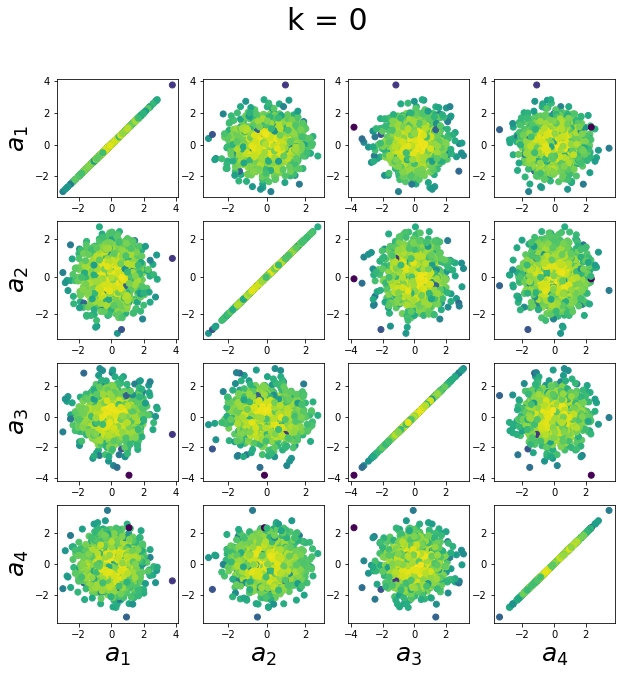

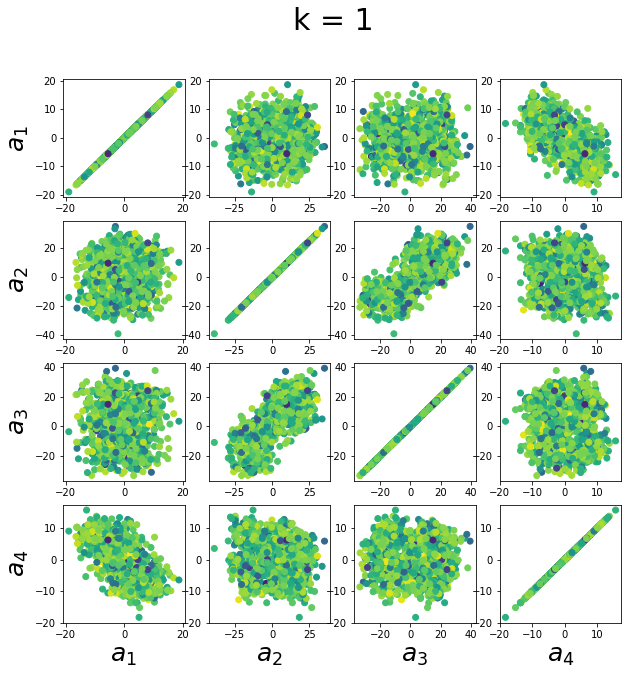

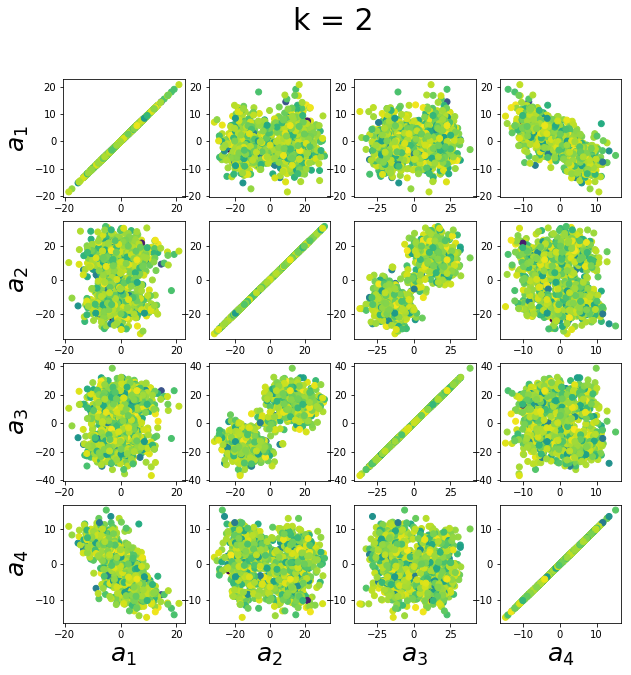

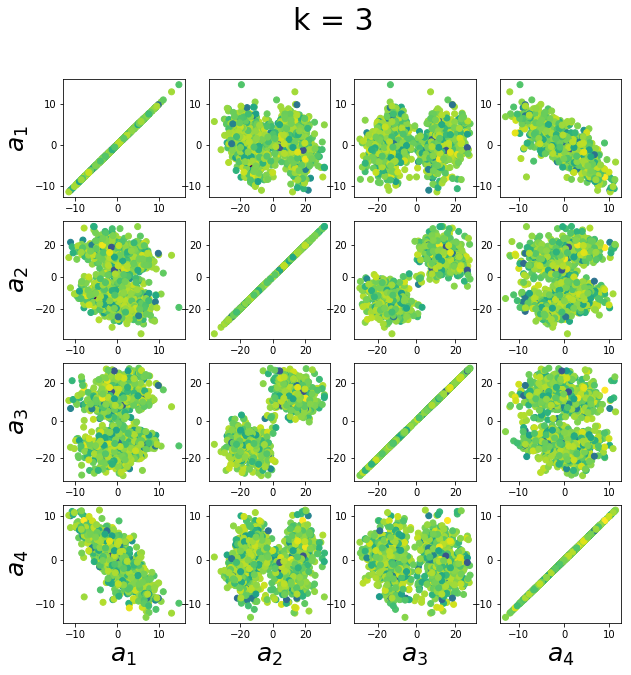

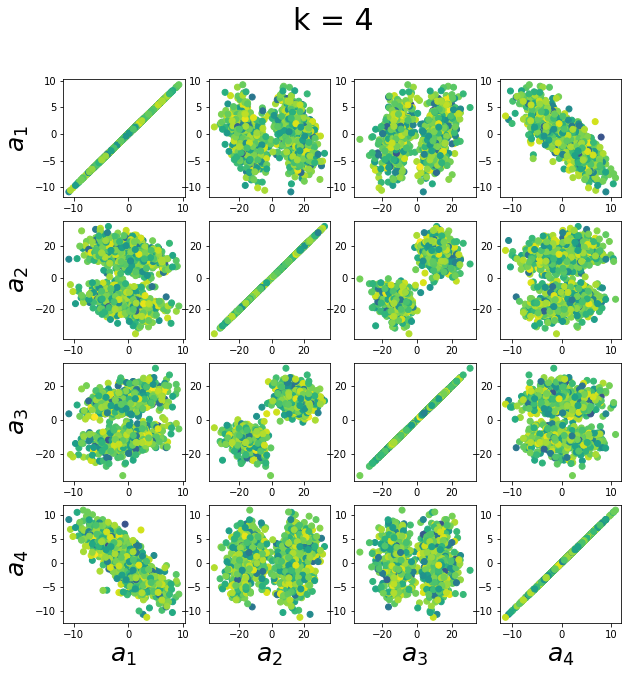

...

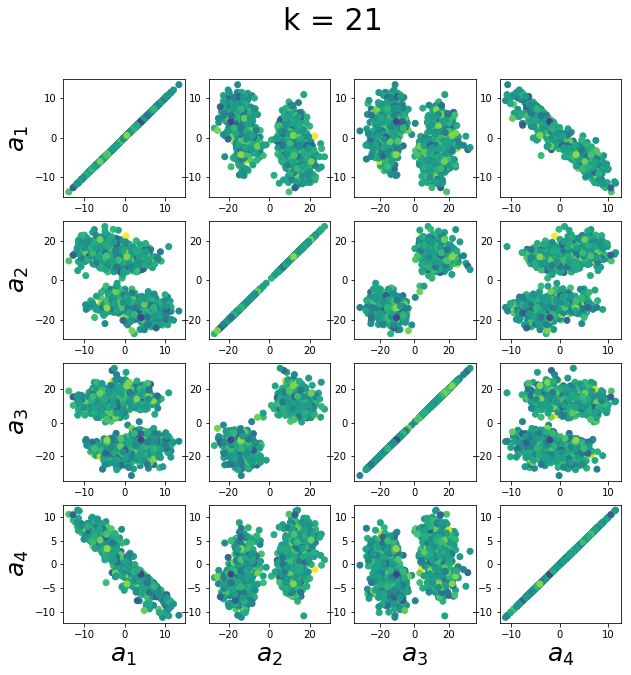

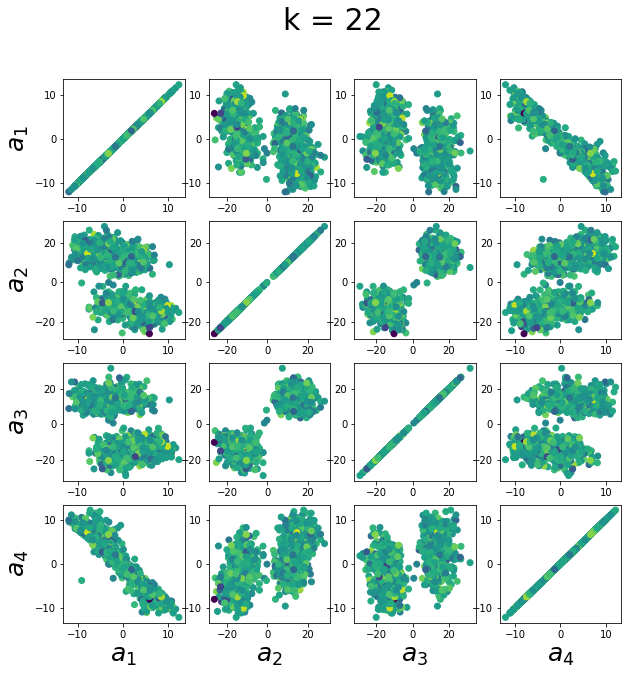

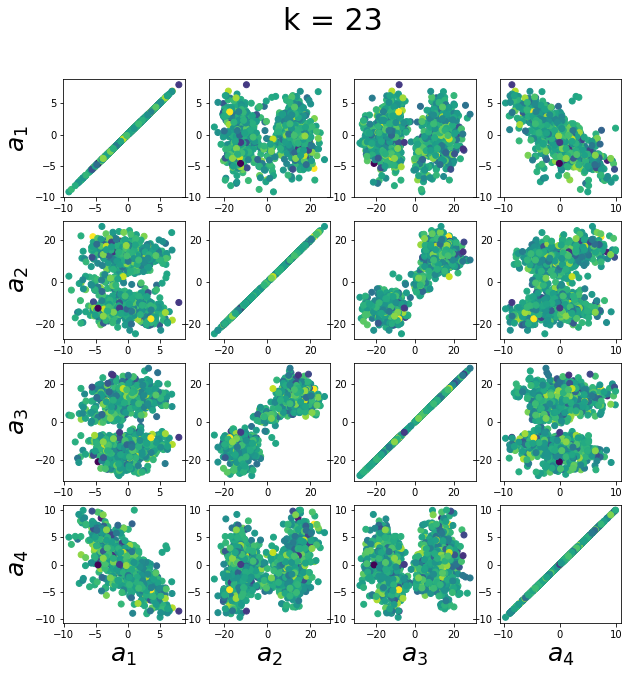

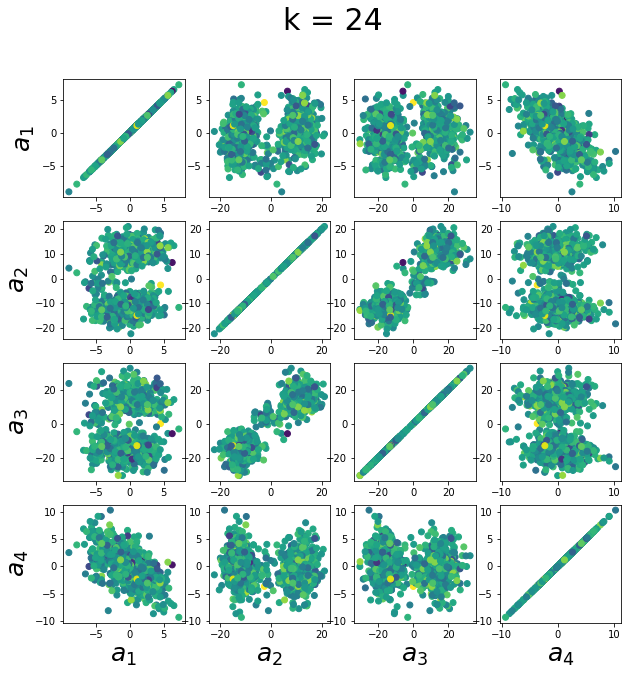

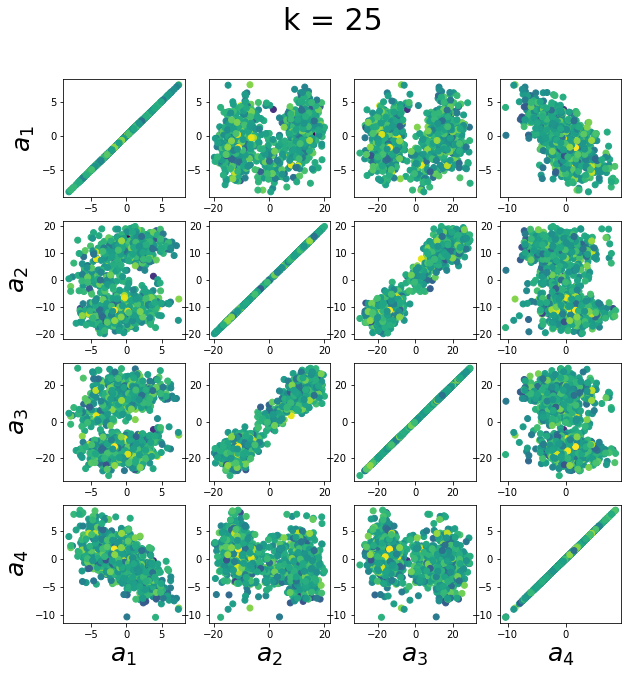

In [24]:
nlayers = 10;
sigma = 1.0;
c_init = -5;
k_max = 25;
rs = 1;

savedir = basedir + dirstr + '/linear_2D_D=4_flow=M_%dP_sigma=%.2f_lr_order=-3_c=%d_rs=%d/' \
                            % (nlayers, sigma, c_init, rs);
fname = savedir + 'results.npz';
npzfile = np.load(fname);

T_phis = npzfile['T_phis'];
phis = npzfile['phis'];
log_q_phis = npzfile['log_q_phis'];

for k in range(k_max+1):
    fontsize = 25;
    figsize = (10, 10);
    plt.figure(figsize=figsize);
    for i in range(system.D):
        for j in range(system.D):
            ind = system.D*i + j + 1;
            plt.subplot(system.D, system.D, ind);
            plt.scatter(phis[k,:,j], phis[k, :, i], c=log_q_phis[k]);
            if (i==3):
                plt.xlabel(r'$a_%d$' % (j+1), fontsize=fontsize);
            if (j==0):
                plt.ylabel(r'$a_%d$' % (i+1), fontsize=fontsize);
    plt.suptitle('k = %d' % k, fontsize=30);

    plt.show();


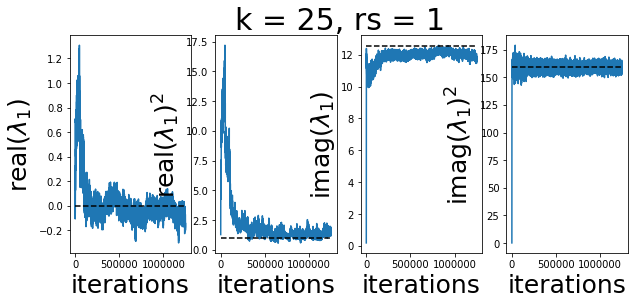

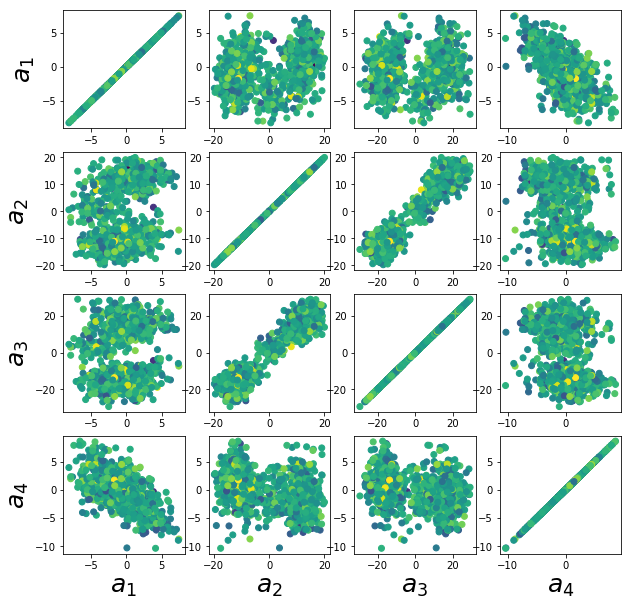

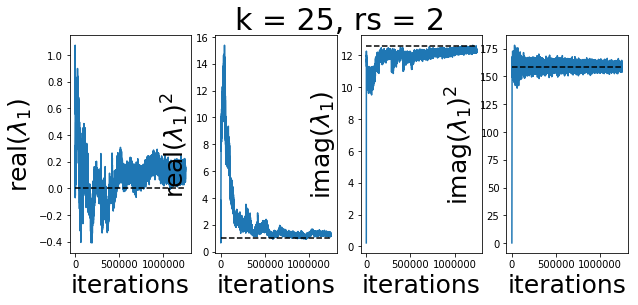

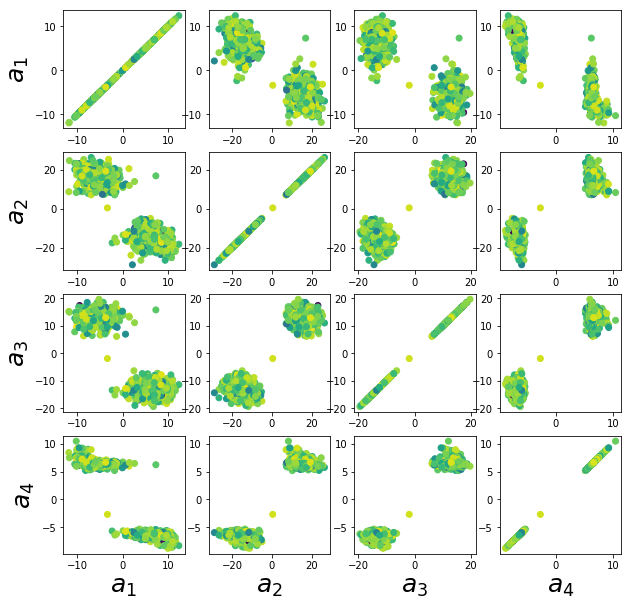

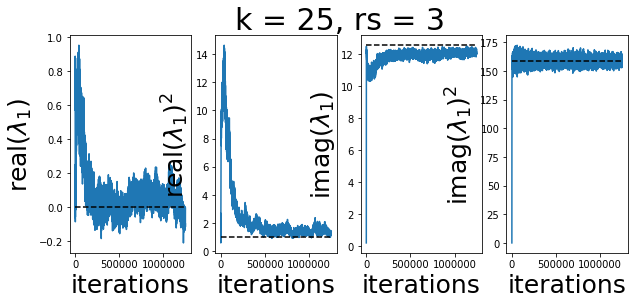

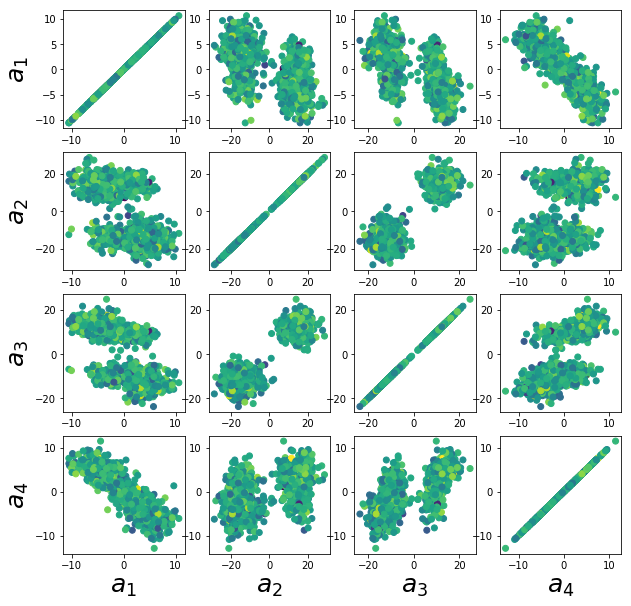

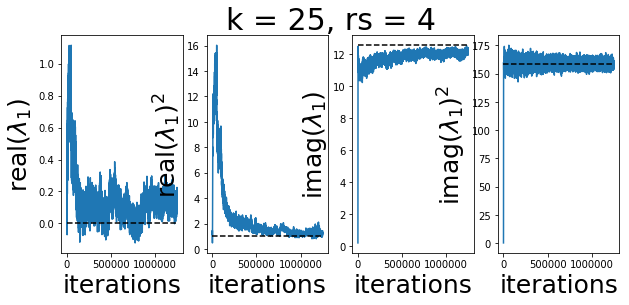

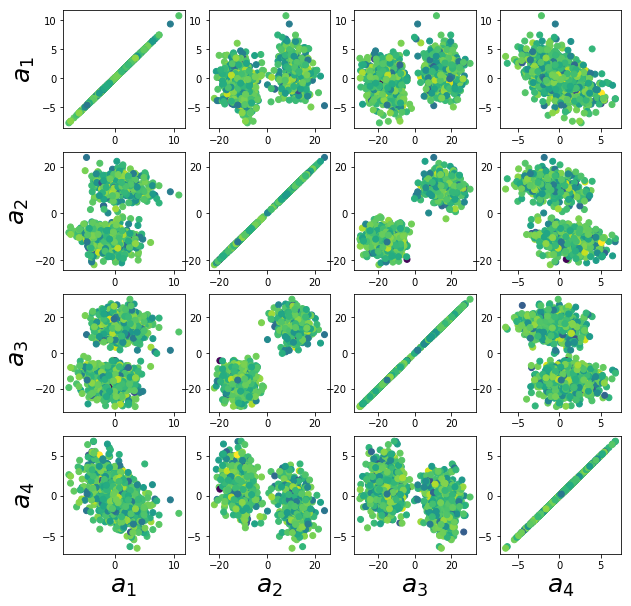

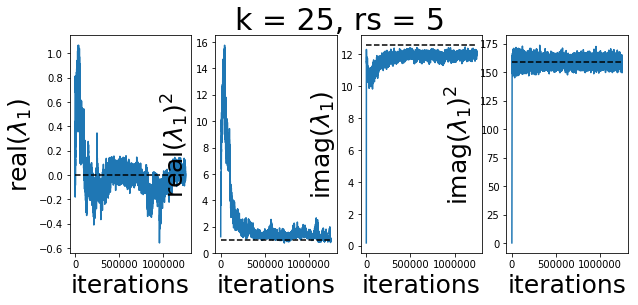

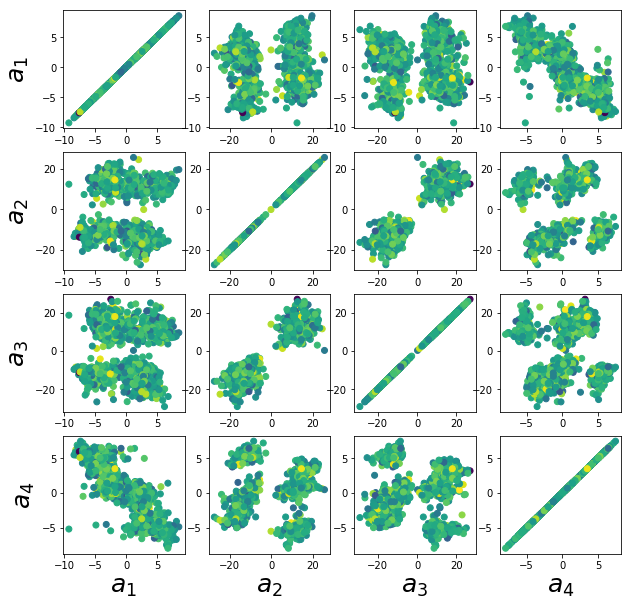

In [25]:
nlayers = 10;
sigma = 1.0;
c_init = -5;
k_max = 25;
rs = 3;


k = 25;
for rs in range(1,6):
    fontsize = 25;
    savedir = basedir + dirstr + '/linear_2D_D=4_flow=M_%dP_sigma=%.2f_lr_order=-3_c=%d_rs=%d/' \
                            % (nlayers, sigma, c_init, rs);
    fname = savedir + 'results.npz';
    npzfile = np.load(fname);

    T_phis = npzfile['T_phis'];
    phis = npzfile['phis'];
    log_q_phis = npzfile['log_q_phis'];
    
    mean_T_phis = npzfile['mean_T_phis'];
    check_rate = npzfile['check_rate'];

    last_ind = npzfile['it']//check_rate;
    num_suff_stats = mean_T_phis.shape[1];
    figsize = (10, 4);
    plt.figure(figsize=figsize);
    for i in range(num_suff_stats):
        plt.subplot(1,4,i+1);
        plt.plot(iterations[:last_ind], mean_T_phis[:last_ind,i], label=label);
        plt.plot([iterations[0], iterations[last_ind]], [mu[i], mu[i]], 'k--');
        #plt.ylim([mu[i]-buf[i], mu[i]+buf[i]]);
        plt.xlabel('iterations', fontsize=fontsize);
        plt.ylabel(constraint_names[i], fontsize=fontsize);
    plt.suptitle('k = %d, rs = %d' % (k, rs), fontsize=30);
         
    figsize = (10, 10);
    plt.figure(figsize=figsize);
    for i in range(system.D):
        for j in range(system.D):
            ind = system.D*i + j + 1;
            plt.subplot(system.D, system.D, ind);
            plt.scatter(phis[k,:,j], phis[k, :, i], c=log_q_phis[k]);
            if (i==3):
                plt.xlabel(r'$a_%d$' % (j+1), fontsize=fontsize);
            if (j==0):
                plt.ylabel(r'$a_%d$' % (i+1), fontsize=fontsize);

    plt.show();


0.6819620750944905 0
1.239513319117862 0
0.18215002565784594 0
0.1694859802297269 0


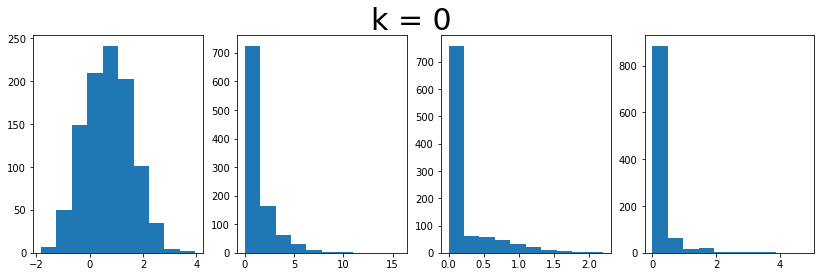

0.7373452814076408 0
13.207306977922272 0
10.450548368437222 0
159.17968937901193 0


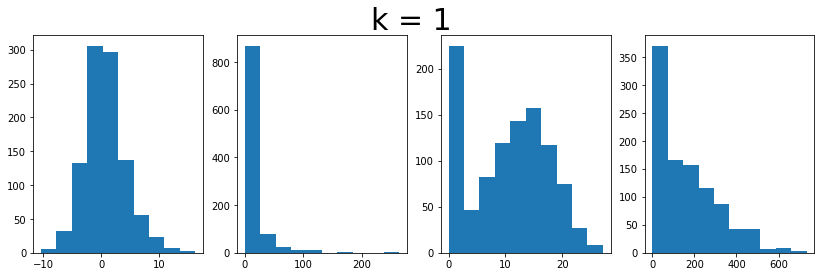

0.30704379549108585 0
7.159256256738599 0
11.192292548489585 0
164.31882545536115 0


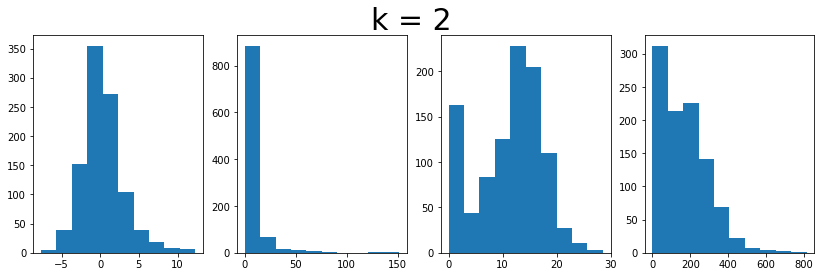

0.07276937375807617 0
2.6972726403467826 0
11.499657669016303 0
160.50447544983024 0


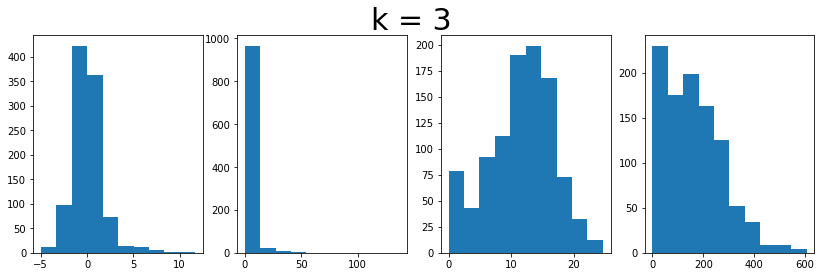

-0.09563855291933854 0
2.5150336148019377 0
11.341435258846454 0
153.3103075805364 0


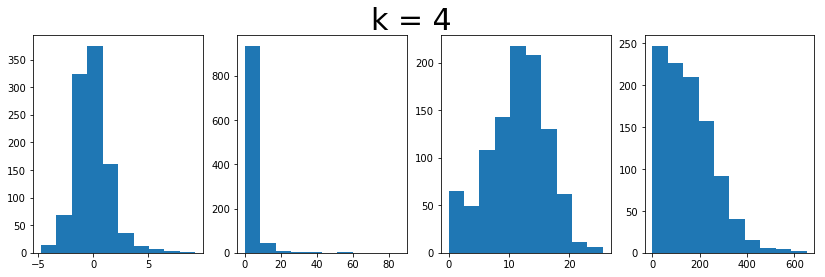

-0.03812040326235492 0
1.4332513847415385 0
12.199941306159754 0
169.98445857456898 0


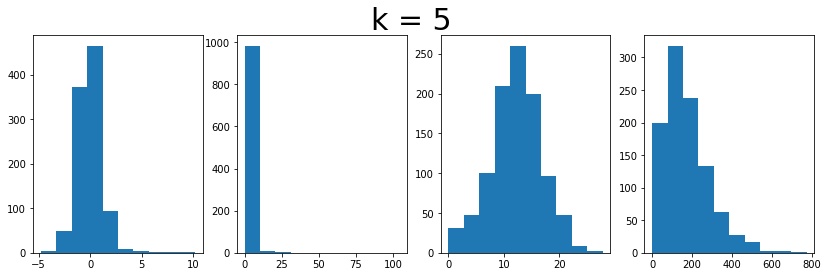

-0.16599138027612967 0
1.7757226420502255 0
11.656762234295027 0
157.3293855638238 0


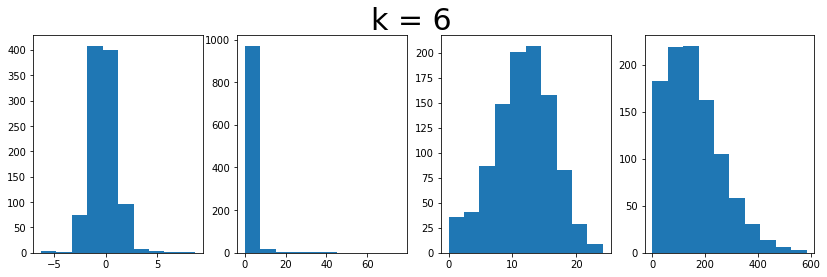

-0.10906830144810534 0
1.806722045816608 0
11.89352654547659 0
160.27951204173505 0


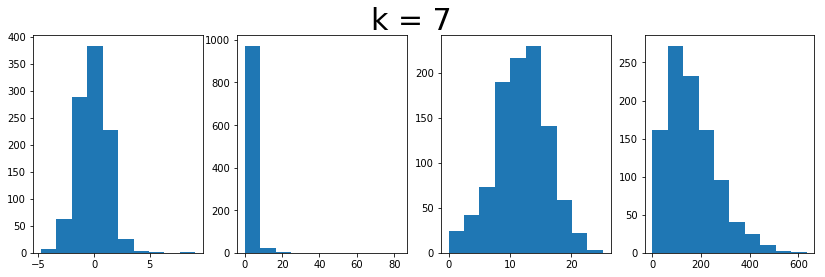

-0.11836136298256747 0
1.3152041131026535 0
11.843849334615989 0
157.48073301855018 0


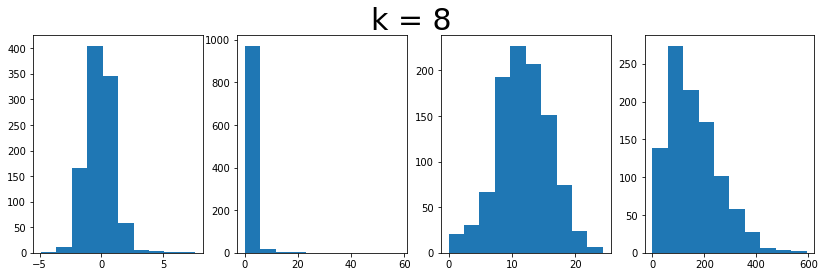

0.06705107089841426 0
1.2498925208183531 0
12.052804110943486 0
161.11070050654806 0


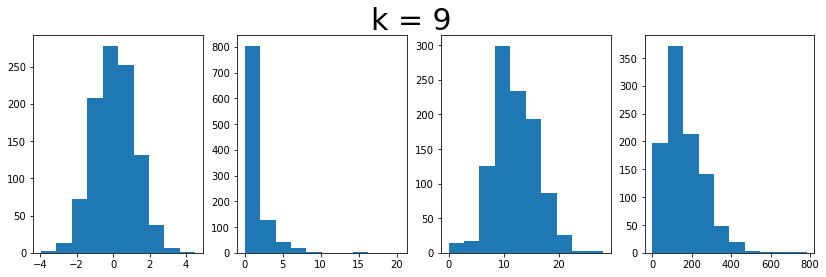

0.038201642713286195 0
1.4862525899204284 0
11.860995400119162 0
155.07547803469816 0


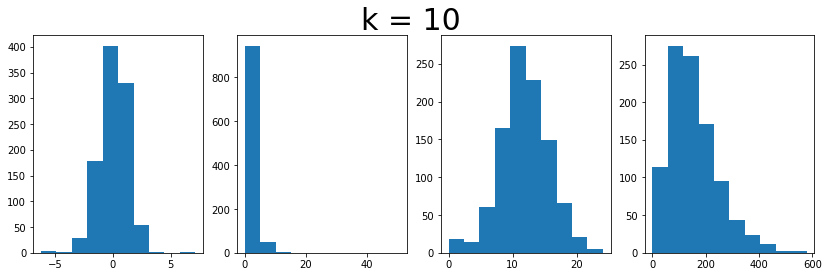

0.1443892690434106 0
1.733899510263519 0
11.607939600041044 0
156.00464821462907 0


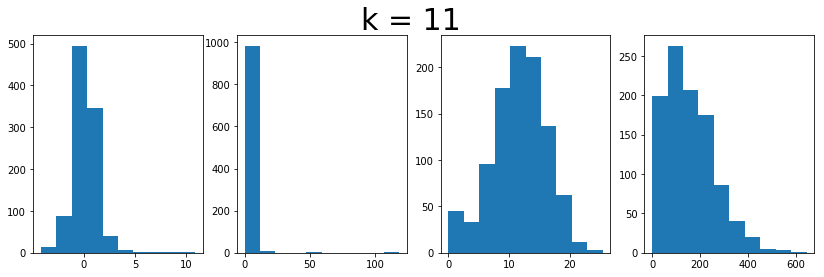

0.020978471855523755 0
1.280248396838048 0
11.994580947441424 0
158.37773996524336 0


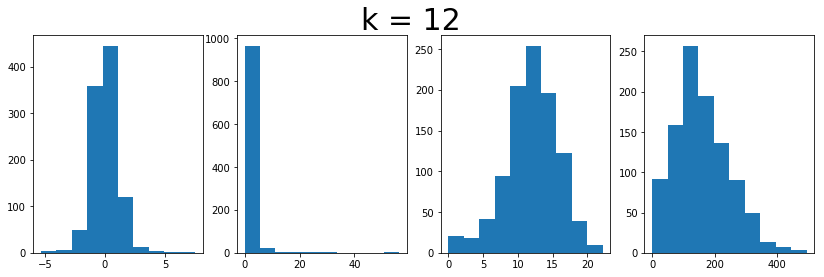

-0.04508204065561206 0
1.1454465157012468 0
12.074473835795796 0
163.58723964748322 0


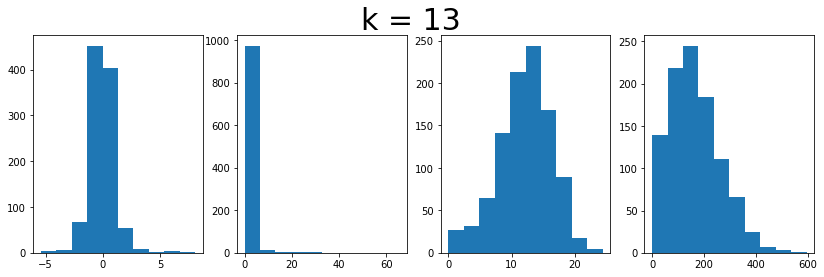

0.11134687116543565 0
1.415817101438885 0
11.771352955798509 0
156.84808072720259 0


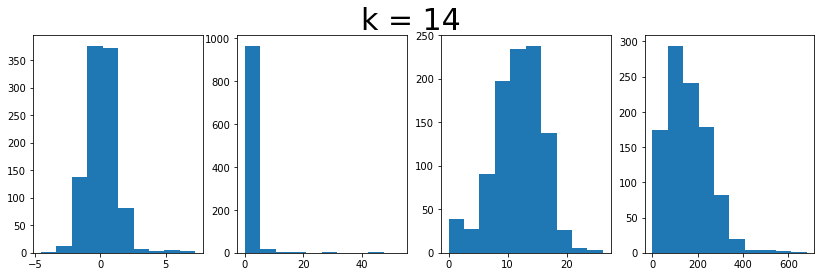

0.001263676429220924 0
1.1951664639273532 0
11.86135306554736 0
156.84055487846274 0


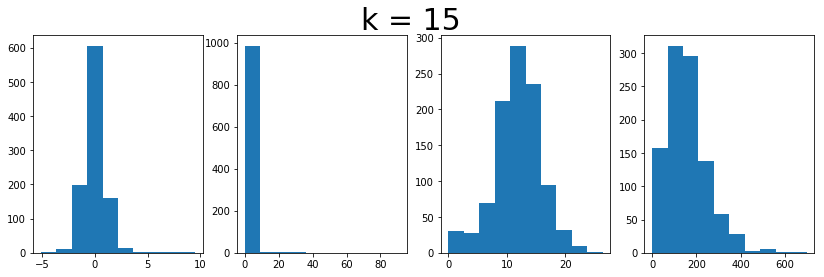

-0.020137551454928748 0
1.1348787040516763 0
11.939417805519643 0
159.05986233423866 0


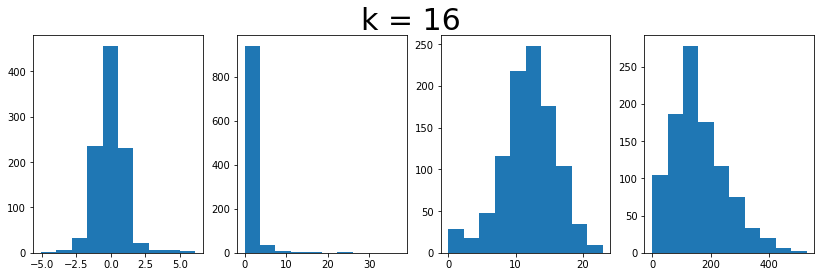

-0.2527906630178388 0
1.225969750062957 0
11.740514349021621 0
157.17503910586976 0


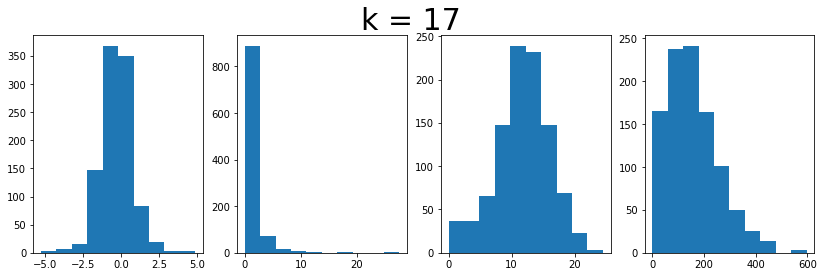

-0.06484191888110481 0
1.098389909080498 0
12.024813006815002 0
160.30500833569036 0


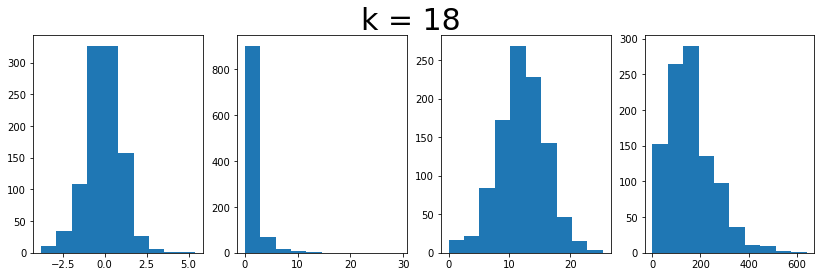

-0.12660860418980913 0
1.3307794590831388 0
11.605970486588012 0
152.56115922955382 0


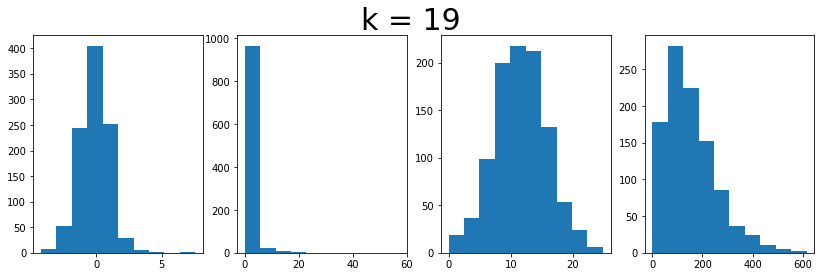

-0.03649344863556019 0
1.3727118756141392 0
11.900849292088493 0
161.75094309047918 0


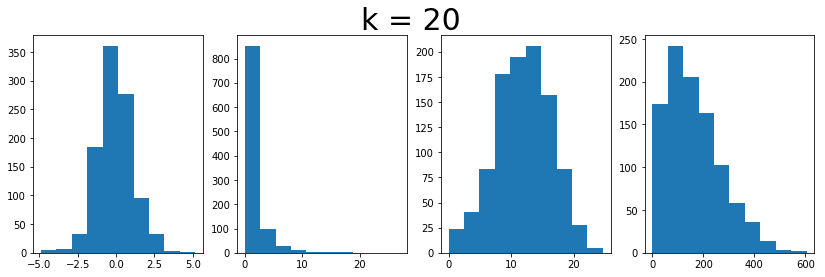

-0.041873729331901074 0
1.221879535516659 0
11.936977597733708 0
158.81232405403225 0


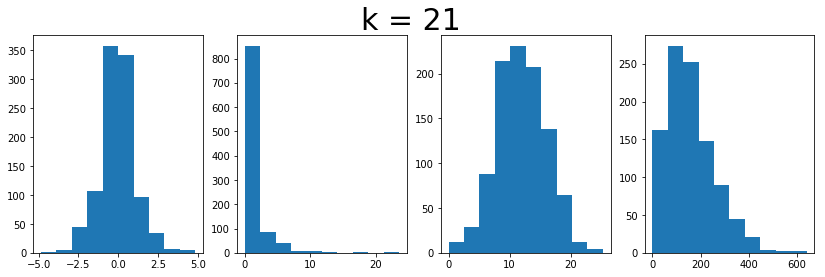

-0.031428332961325446 0
1.2394661527763375 0
11.80830150076964 0
155.47854732674904 0


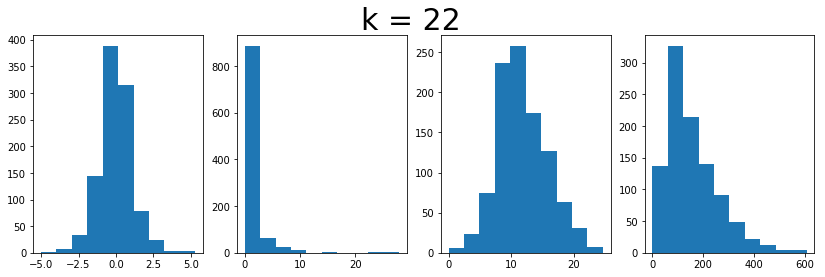

0.013318205288995433 0
1.2520995206278858 0
12.038681400760066 0
159.59448757994065 0


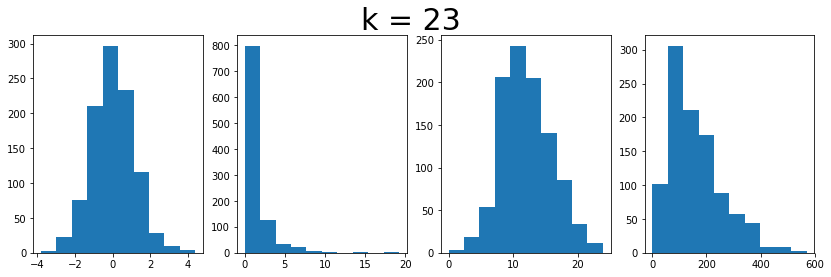

0.04456610945758418 0
1.0261988973599923 0
11.963550537494251 0
158.74979766800325 0


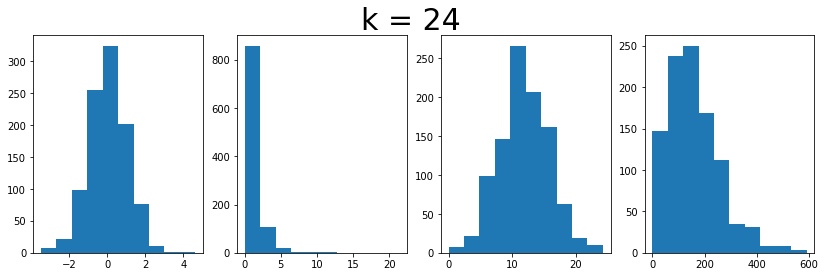

-0.019851747934186877 0
1.0615688456312486 0
12.044060385254918 0
159.3589101981869 0


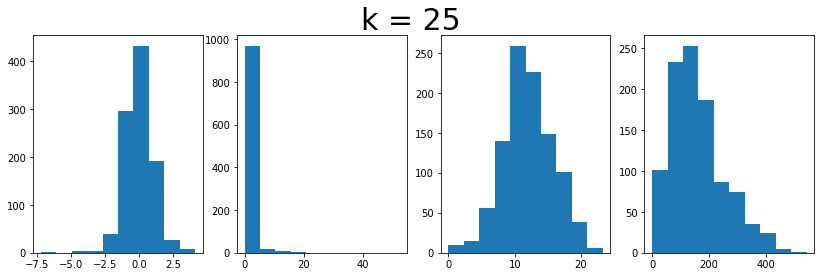

In [26]:
T_phis = npzfile['T_phis'];

for k in range(k_max+1):
    fontsize = 25;
    figsize = (14, 4);
    plt.figure(figsize=figsize);
    for i in range(system.D):
        plt.subplot(1, system.D, i+1);
        plt.hist(T_phis[k,:,i]);
        #for j in range(system.D):
        #    ind = system.D*i + j + 1;
        #    plt.subplot(system.D, system.D, ind);
        #   plt.scatter(T_phis[k,:,j], T_phis[k, :, i], c=log_q_phis[k]);
        #    if (i==3):
        #        plt.xlabel(r'$a_%d$' % (j+1), fontsize=fontsize);
        #    if (j==0):
        #        plt.ylabel(r'$a_%d$' % (i+1), fontsize=fontsize);
        print(np.mean(T_phis[k,:,i]),0);
    plt.suptitle('k = %d' % k, fontsize=30);

    plt.show();


AL it 7


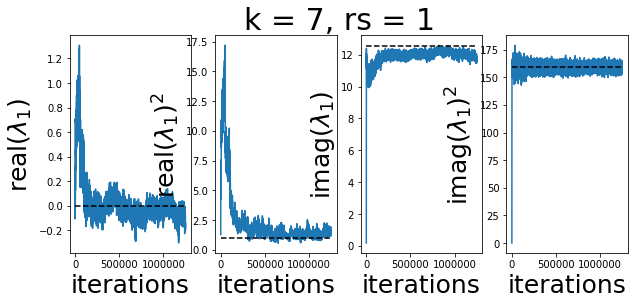

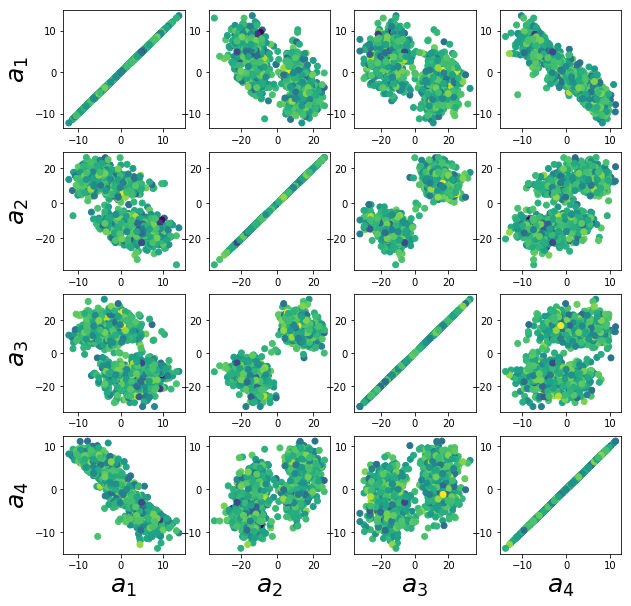

AL it 3


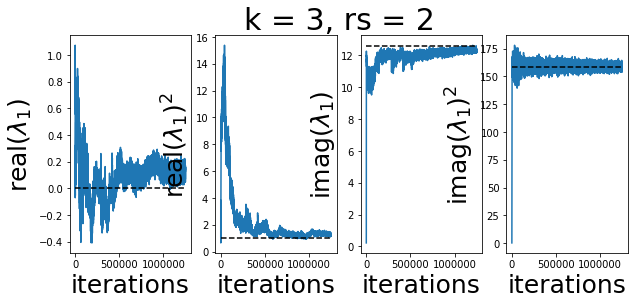

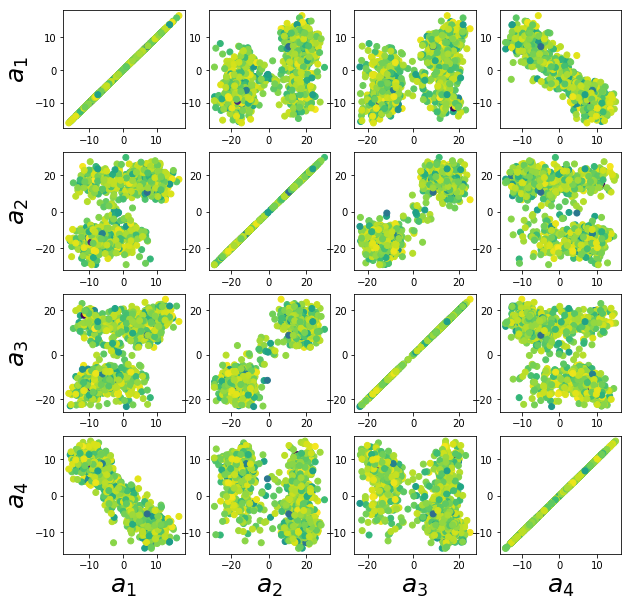

AL it 3


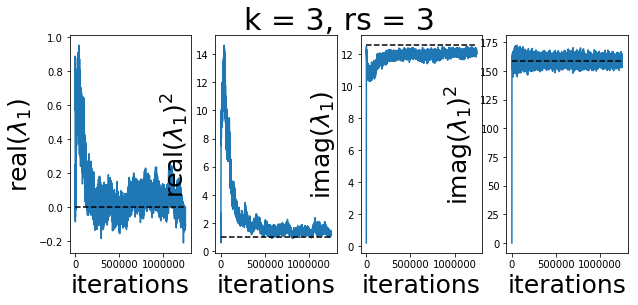

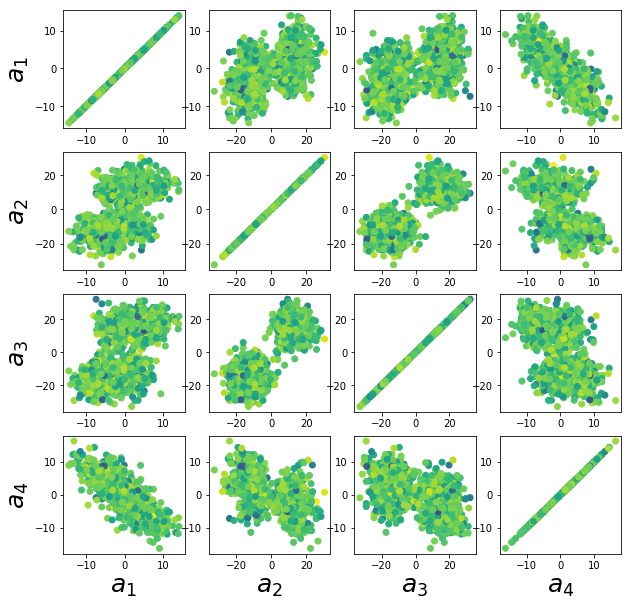

AL it 9


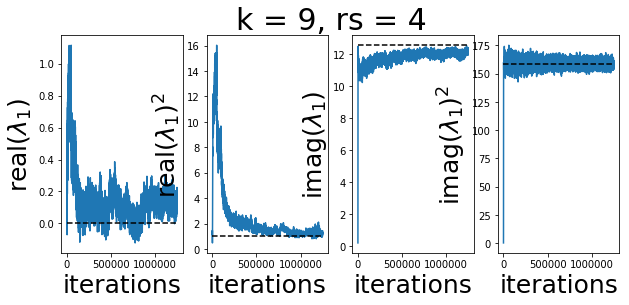

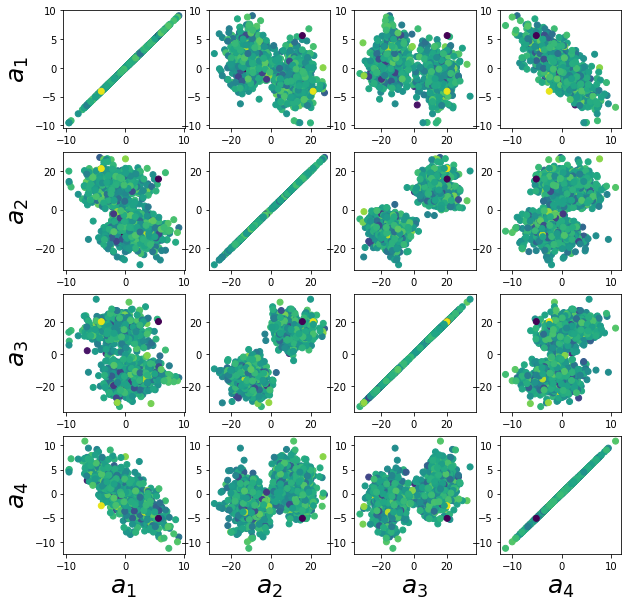

AL it 4


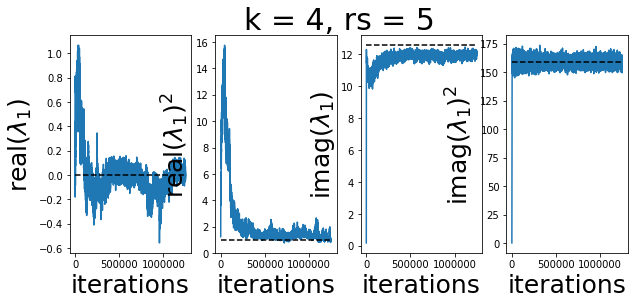

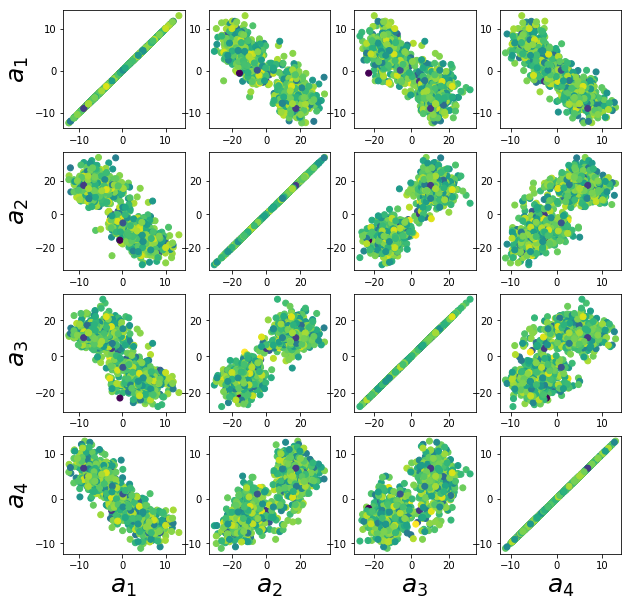

In [51]:
nlayers = 10;
sigma = 1.0;
c_init = -5;
k_max = 25;
rs = 3;


for rs in range(1,6):
    k = AL_final_its[rs-1];
    print('AL it %d' % k);
    fontsize = 25;
    savedir = basedir + dirstr + '/linear_2D_D=4_flow=M_%dP_sigma=%.2f_lr_order=-3_c=%d_rs=%d/' \
                            % (nlayers, sigma, c_init, rs);
    fname = savedir + 'results.npz';
    npzfile = np.load(fname);

    Hs = npzfile['Hs'];
    T_phis = npzfile['T_phis'];
    phis = npzfile['phis'];
    log_q_phis = npzfile['log_q_phis'];
    
    mean_T_phis = npzfile['mean_T_phis'];
    check_rate = npzfile['check_rate'];
    

    last_ind = npzfile['it']//check_rate;
    num_suff_stats = mean_T_phis.shape[1];
    figsize = (10, 4);
    plt.figure(figsize=figsize);
    for i in range(num_suff_stats):
        plt.subplot(1,4,i+1);
        plt.plot(iterations[:last_ind], mean_T_phis[:last_ind,i], label=label);
        plt.plot([iterations[0], iterations[last_ind]], [mu[i], mu[i]], 'k--');
        #plt.ylim([mu[i]-buf[i], mu[i]+buf[i]]);
        plt.xlabel('iterations', fontsize=fontsize);
        plt.ylabel(constraint_names[i], fontsize=fontsize);
    plt.suptitle('k = %d, rs = %d, H(q)=%.2f' % (k, rs, H_k), fontsize=30);
         
    figsize = (10, 10);
    plt.figure(figsize=figsize);
    for i in range(system.D):
        for j in range(system.D):
            ind = system.D*i + j + 1;
            plt.subplot(system.D, system.D, ind);
            plt.scatter(phis[k,:,j], phis[k, :, i], c=log_q_phis[k]);
            if (i==3):
                plt.xlabel(r'$a_%d$' % (j+1), fontsize=fontsize);
            if (j==0):
                plt.ylabel(r'$a_%d$' % (i+1), fontsize=fontsize);

    plt.show();
